# Energy system model of the Spain

In [1]:
import calliope
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

calliope.set_log_verbosity("INFO", include_solver_output=True)

# 1. Reference case
### 1.1. Create and solve the model

In [2]:
model_1 = calliope.read_yaml('model/model.yaml',scenario='base')

[2025-12-16 18:21:00] INFO     Loading overrides from scenario: base 
[2025-12-16 18:21:00] INFO     (scenarios, base ) | Applying the following overrides: [].
[2025-12-16 18:21:00] INFO     Math init | loading pre-defined math.
[2025-12-16 18:21:00] INFO     Math init | loading math files {'operate', 'spores', 'storage_inter_cluster', 'milp', 'base'}.
[2025-12-16 18:21:00] INFO     Model: preprocessing data
[2025-12-16 18:21:00] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:21:01] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:01] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:01] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:01] INFO     input data `name` not defined in model math; it will not be available in 

In [3]:
model_1.inputs.sink_use_equals.to_series().dropna()

timesteps            nodes  techs       
2024-01-01 00:00:00  NLD    demand_power    21863.416667
2024-01-01 01:00:00  NLD    demand_power    21200.666667
2024-01-01 02:00:00  NLD    demand_power    20033.083333
2024-01-01 03:00:00  NLD    demand_power    18867.666667
2024-01-01 04:00:00  NLD    demand_power    18137.166667
                                                ...     
2024-12-30 19:00:00  NLD    demand_power    32269.333333
2024-12-30 20:00:00  NLD    demand_power    32806.250000
2024-12-30 21:00:00  NLD    demand_power    32516.666667
2024-12-30 22:00:00  NLD    demand_power    30309.833333
2024-12-30 23:00:00  NLD    demand_power    27405.333333
Name: sink_use_equals, Length: 8759, dtype: float64

In [4]:
model_1.build()
model_1.solve()

[2025-12-16 18:21:01] INFO     Model: backend build starting
[2025-12-16 18:21:02] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-16 18:21:02] INFO     Optimisation Model | variables | Generated.
[2025-12-16 18:21:04] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-16 18:21:10] INFO     Optimisation Model | constraints | Generated.
[2025-12-16 18:21:10] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-16 18:21:10] INFO     Optimisation Model | objectives | Generated.
[2025-12-16 18:21:10] INFO     Model: backend build complete
[2025-12-16 18:21:15] INFO     Optimisation model | starting model in base mode.
[2025-12-16 18:21:21] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmpak5oos5h.pyomo.lp
Reading time = 0.55 seconds
x1: 227753 rows, 140160 columns, 411707 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [5]:
# It is helpful to store the model results as a whole in NetCDF format, which Calliope can import back
# at any later time. 
model_1.to_netcdf('results/default_results.nc')

In [6]:
# Alternatively, results can be exported as a series of .csv files for inspection and analysis in Excel or
# other software that may benefit from .csv data
#model_1.to_csv('results/default_results_csv')

### 1.2. Marginal technology

In [7]:
# Shadow price for the power system balance constraint
balance_price_1 = model_1.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price_1.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-01-01 00:00:00,0.049768
1,NLD,power,2024-01-01 01:00:00,0.049768
2,NLD,power,2024-01-01 02:00:00,0.049768
3,NLD,power,2024-01-01 03:00:00,0.049768
4,NLD,power,2024-01-01 04:00:00,0.049768


<Axes: >

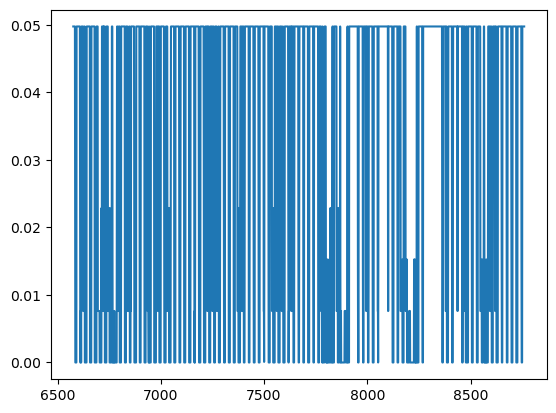

In [8]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price_1['system_balance'].loc[balance_price_1['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [9]:
variable_costs_1 = model_1.results.cost_operation_variable.to_series().dropna()
generation_1 = model_1.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs_1 = variable_costs_1/generation_1

# tranform to a DataFrame
marginal_generation_costs_1 = marginal_generation_costs_1.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs_1 = marginal_generation_costs_1.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs_1.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768


In [10]:
# Merge marginal generation costs with balance price
merged_1 = marginal_generation_costs_1.merge(
    balance_price_1,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged_1.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768,0.049768


In [11]:
merged_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  46071 non-null  float64       
 6   system_balance            61320 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [12]:
# turn system_balance and marginal_generation_cost into float type
merged_1['system_balance'] = merged_1['system_balance'].astype(float)
merged_1['marginal_generation_cost'] = merged_1['marginal_generation_cost'].astype(float)

# drop rows with NaN values in marginal_generation_cost
merged_1 = merged_1.dropna(subset=['marginal_generation_cost'])
merged_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 46071 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     46071 non-null  object        
 1   techs                     46071 non-null  object        
 2   costs                     46071 non-null  object        
 3   timesteps                 46071 non-null  datetime64[ns]
 4   carriers                  46071 non-null  object        
 5   marginal_generation_cost  46071 non-null  float64       
 6   system_balance            46071 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 2.8+ MB


In [13]:
# Compute absolute difference between marginal cost and price
merged_1['diff'] = (merged_1['marginal_generation_cost'] - merged_1['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech_1 = (
    merged_1.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech_1.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-01-01 00:00:00,NLD,ccgt,0.049768,0.049768,2.467905e-09
1,2024-01-01 01:00:00,NLD,ccgt,0.049768,0.049768,2.883262e-09
2,2024-01-01 02:00:00,NLD,ccgt,0.049768,0.049768,4.514502e-09
3,2024-01-01 03:00:00,NLD,ccgt,0.049768,0.049768,1.071232e-08
4,2024-01-01 04:00:00,NLD,ccgt,0.049768,0.049768,7.425223e-08


In [14]:
tech_colors = {
    "load_shedding": "#000000",
    "ccgt": "#E37A72",
    "nuclear": "#F3007A",
    "hydro": "#7900f3",
    "solar_pv": "#F9D956",
    "wind_onshore": "#56F9C0",
    "wind_offshore": "#56CBF9"
}

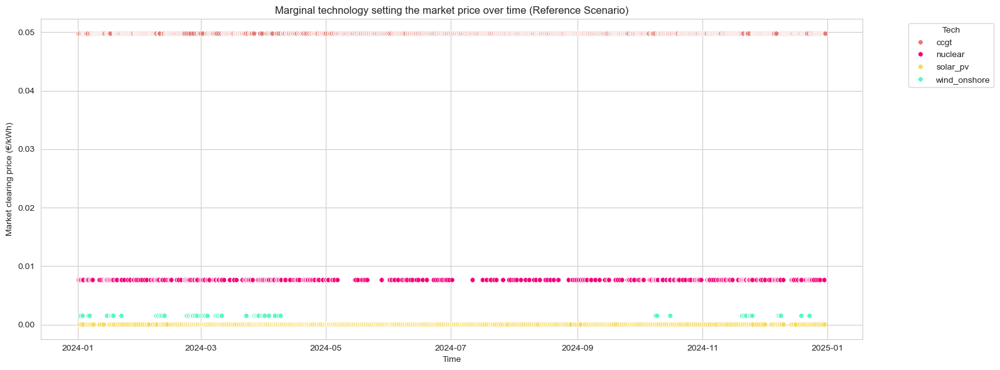

In [15]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_1,
    x='timesteps',
    y='marginal_generation_cost',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Reference Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [16]:
# Count how many hours each tech is marginal
freq = marginal_tech_1['techs'].value_counts().sort_values(ascending=False)
share = (freq / freq.sum()).rename('share')

share_df_1 = share.reset_index()
share_df_1.columns = ['techs', 'scenario_1']
share_df_1

,techs,scenario_1
0,ccgt,0.569178
1,solar_pv,0.300457
2,nuclear,0.100342
3,wind_onshore,0.030023


### 1.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [17]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [18]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/default_results.nc', plot_export_path='results/default_dispatch.html')

[2025-12-16 18:21:29] INFO     Model: preprocessing data (reentry)
[2025-12-16 18:21:29] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:21:29] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:29] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:29] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:29] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:29] INFO     Model: initialisation complete


## 1.4.  Load, residual load and price duration curves

In [19]:
gen_techs = ['solar_pv','wind_onshore', 'hydro', 'ccgt', 'nuclear'] 

In [20]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model_1 = calliope.read_netcdf('results/default_results.nc')

[2025-12-16 18:21:33] INFO     Model: preprocessing data (reentry)
[2025-12-16 18:21:33] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:21:33] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:33] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:33] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:33] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:33] INFO     Model: initialisation complete


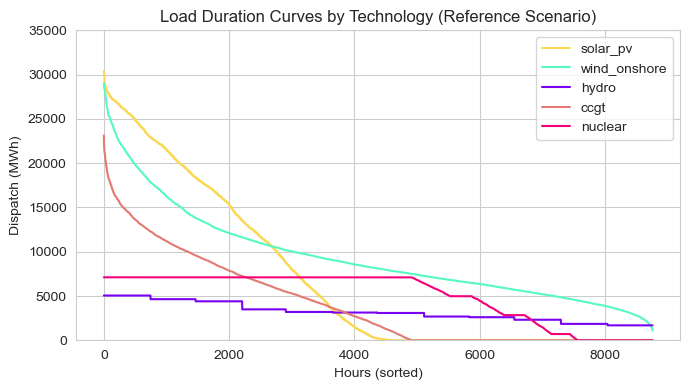

In [21]:
dispatch = {}
for tech in gen_techs:
    series = (
        model_1.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Reference Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.ylim(0, 35000) 
plt.tight_layout()
plt.show()

In [22]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price_1['system_balance'].to_frame(), 
                         plot_export_path='results/default_price.html', 
                         y_label='Price (EUR/kWh)')

In [23]:
# Obtain demand from input
demand_1 = model_1.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch_1 = model_1.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch_1 = model_1.results.flow_out.sel(techs='wind_onshore').to_series().dropna()
# Calculate the residual load (load minus renewable generation)
residual_load_1 = demand_1 - (solar_pv_dispatch_1 + wind_onshore_dispatch_1)
residual_load_1.head()

timesteps            nodes  carriers
2024-01-01 00:00:00  NLD    power       14227.213915
2024-01-01 01:00:00  NLD    power       13855.561467
2024-01-01 02:00:00  NLD    power       12969.140277
2024-01-01 03:00:00  NLD    power       12110.037851
2024-01-01 04:00:00  NLD    power       11647.892891
dtype: float64

In [24]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load_1.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/default_residual_load.html',
                         y_label='Residual Load (MWh)')


### 1.5. CO2 emissions

In [25]:
# to get hourly generation for all techs, power carrier only
power_gen_1 = model_1.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [26]:
# change to dataframe
gen_df_1 = power_gen_1.to_series().reset_index()

# find average generation for each tech
avg_gen_1 = gen_df_1.groupby('techs')['flow_out'].mean().reset_index()
avg_gen_1 = avg_gen_1.rename(columns={'flow_out': 'avg_generation_1'})
avg_gen_1

,techs,avg_generation_1
0,ccgt,4062.403138
1,curtailment,NaN
2,demand_power,NaN
3,hydro,3184.593879
4,load_shedding,0.000004
5,nuclear,5067.224038
6,solar_pv,6826.125109
7,wind_offshore,0.000000
8,wind_onshore,9375.956147


In [27]:
 # find total generation for each tech
total_gen_1 = gen_df_1.groupby('techs')['flow_out'].sum().reset_index()
total_gen_1 = total_gen_1.rename(columns={'flow_out': 'total_generation_1'})
total_gen_1

,techs,total_generation_1
0,ccgt,3.558665e+07
1,curtailment,0.000000e+00
2,demand_power,0.000000e+00
3,hydro,2.789704e+07
4,load_shedding,3.894848e-02
5,nuclear,4.438888e+07
6,solar_pv,5.979686e+07
7,wind_offshore,0.000000e+00
8,wind_onshore,8.213338e+07


In [28]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [29]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen_1.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [30]:
# Total across all emitting techs
total_emissions_t_1 = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t_1:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t_1/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 14,946,393.62 tCO2

Total CO2 emissions: 14,946,393.62 tCO2
Total CO2 emissions: 14.946 MtCO2


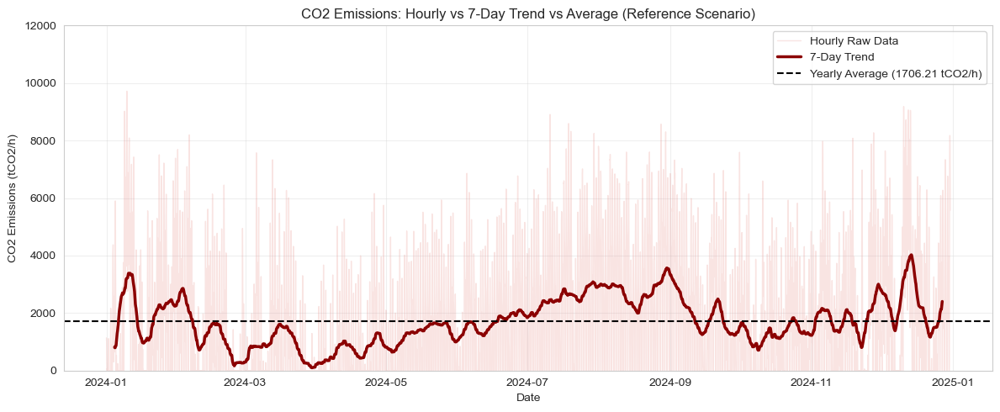

In [31]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Reference Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.ylim(0, 12000) 
plt.tight_layout()
plt.show()

### 1.6. Cost recovery

In [32]:
# Flow out for all gen techs in one go
dispatch_1 = (
    model_1.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch_1.head()


techs,nodes,timesteps,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,2024-01-01 00:00:00,0.0,7636.202752,4404.821169,2705.392793,7116.999971
1,NLD,2024-01-01 01:00:00,0.0,7345.105200,4404.821169,2333.740345,7116.999971
2,NLD,2024-01-01 02:00:00,0.0,7063.943056,4404.821169,1447.319156,7116.999971
3,NLD,2024-01-01 03:00:00,0.0,6757.628816,4404.821169,588.216729,7116.999971
4,NLD,2024-01-01 04:00:00,0.0,6489.273776,4404.821169,126.071769,7116.999971


In [33]:
# Shadow price dataframe
balance_price_1 = (
    model_1.results.shadow_price_system_balance
    .to_series().reset_index()
)

# Merge price into dispatch
df_1 = balance_price_1.merge(dispatch_1, on='timesteps', how='left')
df_1.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,power,2024-01-01 00:00:00,0.049768,NLD,0.0,7636.202752,4404.821169,2705.392793,7116.999971
1,NLD,power,2024-01-01 01:00:00,0.049768,NLD,0.0,7345.105200,4404.821169,2333.740345,7116.999971
2,NLD,power,2024-01-01 02:00:00,0.049768,NLD,0.0,7063.943056,4404.821169,1447.319156,7116.999971
3,NLD,power,2024-01-01 03:00:00,0.049768,NLD,0.0,6757.628816,4404.821169,588.216729,7116.999971
4,NLD,power,2024-01-01 04:00:00,0.049768,NLD,0.0,6489.273776,4404.821169,126.071769,7116.999971


In [34]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df_1[f'{tech}_revenue'] = df_1[tech] * df_1['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue_1 = df_1[[f'{t}_revenue' for t in gen_techs]].sum()
revenue_1.index = revenue_1.index.str.replace('_revenue', '', regex=False)
revenue_1.name = 'revenue'
revenue_1

solar_pv        4.411623e+05
wind_onshore    2.064554e+06
hydro           7.870620e+05
ccgt            1.771091e+06
nuclear         1.807826e+06
Name: revenue, dtype: float64

In [35]:
cost_1 = (
    model_1.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost_1 = cost_1.droplevel('costs')                # or just drop the level
cost_1.name = 'cost'
cost_1


techs
solar_pv        6.338467e+02
wind_onshore    1.238571e+05
hydro           8.369113e+04
ccgt            1.771091e+06
nuclear         3.385661e+05
Name: cost, dtype: float64

In [36]:
# calculate profit and cost recovery ratio
covery_1 = pd.concat([revenue_1, cost_1], axis=1)
covery_1['profit'] = covery_1['revenue'] - covery_1['cost'] # >0 means revenue covers cost
covery_1['cost_recovery_ratio'] = covery_1['revenue'] / covery_1['cost']  # >1 means full recovery
covery_1

,revenue,cost,profit,cost_recovery_ratio
solar_pv,4.411623e+05,6.338467e+02,4.405285e+05,696.007937
wind_onshore,2.064554e+06,1.238571e+05,1.940697e+06,16.668833
hydro,7.870620e+05,8.369113e+04,7.033709e+05,9.404366
ccgt,1.771091e+06,1.771091e+06,-2.739328e-02,1.000000
nuclear,1.807826e+06,3.385661e+05,1.469260e+06,5.339654


In [37]:
covery_df_1 = covery_1.reset_index()
covery_df_1.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df_1

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,4.411623e+05,6.338467e+02,4.405285e+05,696.007937
1,wind_onshore,2.064554e+06,1.238571e+05,1.940697e+06,16.668833
2,hydro,7.870620e+05,8.369113e+04,7.033709e+05,9.404366
3,ccgt,1.771091e+06,1.771091e+06,-2.739328e-02,1.000000
4,nuclear,1.807826e+06,3.385661e+05,1.469260e+06,5.339654


[2025-12-16 18:21:34] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\2165061241.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-16 18:21:34] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\2165061241.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




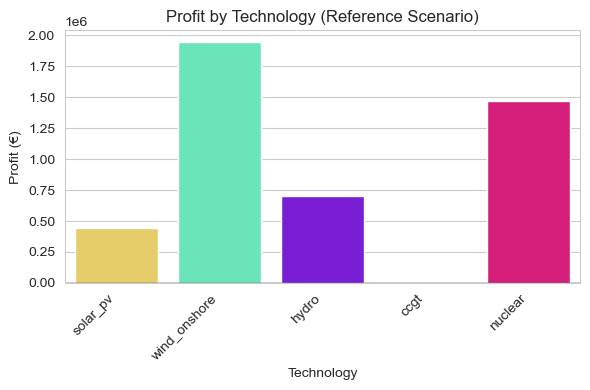

[2025-12-16 18:21:34] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\2165061241.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





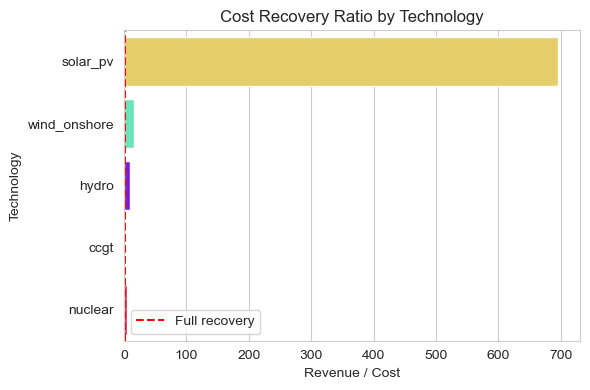

In [38]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_1,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Reference Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_1,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 2. Renewables growth case
### 2.1. Reload the model with a scenario that forces a higher capacity of renewables and re-solve

In [39]:
model_2 = calliope.read_yaml('model/model.yaml',scenario='more_renewables')

[2025-12-16 18:21:34] INFO     Loading overrides from scenario: more_renewables 
[2025-12-16 18:21:34] INFO     (scenarios, more_renewables ) | Applying the following overrides: ['higher_renewables'].
[2025-12-16 18:21:34] INFO     Math init | loading pre-defined math.
[2025-12-16 18:21:34] INFO     Math init | loading math files {'operate', 'spores', 'storage_inter_cluster', 'milp', 'base'}.
[2025-12-16 18:21:34] INFO     Model: preprocessing data
[2025-12-16 18:21:34] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:21:35] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:35] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:35] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:21:35] INFO     input data `name` not defined in

In [40]:
model_2.inputs.sink_use_equals.to_series().dropna()

timesteps            nodes  techs       
2024-01-01 00:00:00  NLD    demand_power    21863.416667
2024-01-01 01:00:00  NLD    demand_power    21200.666667
2024-01-01 02:00:00  NLD    demand_power    20033.083333
2024-01-01 03:00:00  NLD    demand_power    18867.666667
2024-01-01 04:00:00  NLD    demand_power    18137.166667
                                                ...     
2024-12-30 19:00:00  NLD    demand_power    32269.333333
2024-12-30 20:00:00  NLD    demand_power    32806.250000
2024-12-30 21:00:00  NLD    demand_power    32516.666667
2024-12-30 22:00:00  NLD    demand_power    30309.833333
2024-12-30 23:00:00  NLD    demand_power    27405.333333
Name: sink_use_equals, Length: 8759, dtype: float64

In [41]:
model_2.build()
model_2.solve()

[2025-12-16 18:21:35] INFO     Model: backend build starting
[2025-12-16 18:21:35] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-16 18:21:36] INFO     Optimisation Model | variables | Generated.
[2025-12-16 18:21:37] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-16 18:21:43] INFO     Optimisation Model | constraints | Generated.
[2025-12-16 18:21:43] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-16 18:21:43] INFO     Optimisation Model | objectives | Generated.
[2025-12-16 18:21:43] INFO     Model: backend build complete
[2025-12-16 18:21:48] INFO     Optimisation model | starting model in base mode.
[2025-12-16 18:21:54] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmp9df2iwcj.pyomo.lp
Reading time = 0.63 seconds
x1: 227753 rows, 140160 columns, 411707 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [42]:
model_2.to_netcdf('results/more_vres.nc')

### 2.2. Marginal technology

In [43]:
# Shadow price for the power system balance constraint
balance_price_2 = model_2.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price_2.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-01-01 00:00:00,0.049768
1,NLD,power,2024-01-01 01:00:00,0.049768
2,NLD,power,2024-01-01 02:00:00,0.007627
3,NLD,power,2024-01-01 03:00:00,0.007627
4,NLD,power,2024-01-01 04:00:00,0.007627


<Axes: >

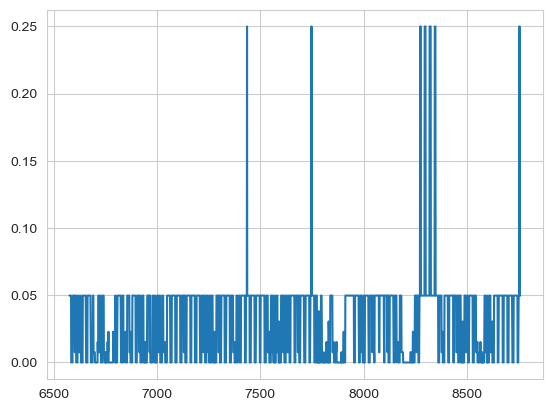

In [44]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price_2['system_balance'].loc[balance_price_2['timesteps'].isin(days_of_interest)].plot()

In [45]:
variable_costs_2 = model_2.results.cost_operation_variable.to_series().dropna()
generation_2 = model_2.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs_2 = variable_costs_2/generation_2

# tranform to a DataFrame
marginal_generation_costs_2 = marginal_generation_costs_2.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs_2 = marginal_generation_costs_2.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs_2.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768


In [46]:
# Merge marginal generation costs with balance price
merged_2 = marginal_generation_costs_2.merge(
    balance_price_2,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged_2.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768,0.007627
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768,0.007627
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768,0.007627


In [47]:
merged_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  54297 non-null  float64       
 6   system_balance            61320 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [48]:
# turn system_balance and marginal_generation_cost into float type
merged_2['system_balance'] = merged_2['system_balance'].astype(float)
merged_2['marginal_generation_cost'] = merged_2['marginal_generation_cost'].astype(float)

# drop rows with NaN values in marginal_generation_cost
merged_2 = merged_2.dropna(subset=['marginal_generation_cost'])
merged_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54297 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     54297 non-null  object        
 1   techs                     54297 non-null  object        
 2   costs                     54297 non-null  object        
 3   timesteps                 54297 non-null  datetime64[ns]
 4   carriers                  54297 non-null  object        
 5   marginal_generation_cost  54297 non-null  float64       
 6   system_balance            54297 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [49]:
# Compute absolute difference between marginal cost and price
merged_2['diff'] = (merged_2['marginal_generation_cost'] - merged_2['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech_2 = (
    merged_2.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech_2.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-01-01 00:00:00,NLD,ccgt,0.049768,0.049768,3.972810e-11
1,2024-01-01 01:00:00,NLD,ccgt,0.049768,0.049768,7.666096e-11
2,2024-01-01 02:00:00,NLD,nuclear,0.007627,0.007627,7.922211e-11
3,2024-01-01 03:00:00,NLD,nuclear,0.007627,0.007627,1.592125e-11
4,2024-01-01 04:00:00,NLD,nuclear,0.007627,0.007627,1.143446e-11


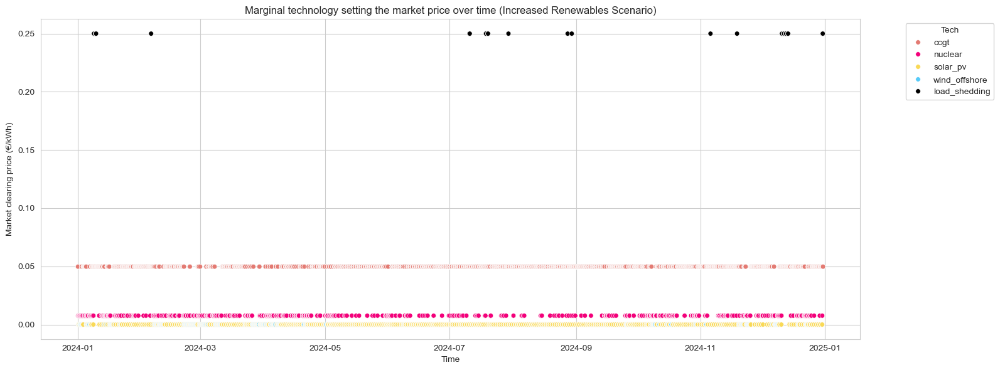

In [50]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_2,
    x='timesteps',
    y='marginal_generation_cost',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Increased Renewables Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [51]:
# Count how many hours each tech is marginal
freq = marginal_tech_2['techs'].value_counts().sort_values(ascending=False)
share = (freq / freq.sum()).rename('share')

share_df_2 = share.reset_index()
share_df_2.columns = ['techs', 'scenario_2']
share_df_2

,techs,scenario_2
0,ccgt,0.484703
1,solar_pv,0.345662
2,nuclear,0.113584
3,wind_offshore,0.050571
4,load_shedding,0.005479


### 2.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [52]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [53]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/more_vres.nc', plot_export_path='results/more_vres.html')

[2025-12-16 18:22:01] INFO     Model: preprocessing data (reentry)
[2025-12-16 18:22:01] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:22:01] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:01] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:01] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:01] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:01] INFO     Model: initialisation complete


### 2.4.  Load, residual load and price duration curves

In [54]:
gen_techs = ['solar_pv','wind_onshore', 'wind_offshore', 'hydro', 'ccgt', 'nuclear'] 

In [55]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model_2 = calliope.read_netcdf('results/more_vres.nc')

[2025-12-16 18:22:02] INFO     Model: preprocessing data (reentry)
[2025-12-16 18:22:02] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:22:02] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:02] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:02] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:02] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:02] INFO     Model: initialisation complete


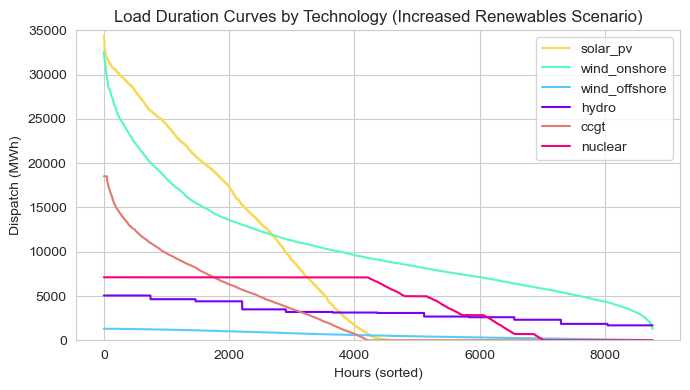

In [56]:
dispatch = {}
for tech in gen_techs:
    series = (
        model_2.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Increased Renewables Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.ylim(0, 35000) 
plt.tight_layout()
plt.show()

In [57]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price_2['system_balance'].to_frame(), 
                         plot_export_path='results/more_vres_price.html', 
                         y_label='Price (EUR/kWh)')

In [58]:
# Obtain demand from input
demand_2 = model_2.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch_2 = model_2.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch_2 = model_2.results.flow_out.sel(techs='wind_onshore').to_series().dropna()
wind_offshore_dispatch_2 = model_2.results.flow_out.sel(techs='wind_offshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load_2 = demand_2 - (solar_pv_dispatch_2 + wind_onshore_dispatch_2 + wind_offshore_dispatch_2)
residual_load_2.head()

timesteps            nodes  carriers
2024-01-01 00:00:00  NLD    power       12283.564587
2024-01-01 01:00:00  NLD    power       11929.840485
2024-01-01 02:00:00  NLD    power       11122.325411
2024-01-01 03:00:00  NLD    power       10392.195609
2024-01-01 04:00:00  NLD    power       10030.531002
dtype: float64

In [59]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load_2.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/more_vres_residual_load.html',
                         y_label='Residual Load (MWh)')


### 2.5. CO2 emissions

In [60]:
# to get hourly generation for all techs, power carrier only
power_gen_2 = model_2.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [61]:
# change to dataframe
gen_df_2 = power_gen_2.to_series().reset_index()

# find average generation for each tech
avg_gen_2 = gen_df_2.groupby('techs')['flow_out'].mean().reset_index()
avg_gen_2 = avg_gen_2.rename(columns={'flow_out': 'avg_generation_2'})
avg_gen_2

,techs,avg_generation_2
0,ccgt,3214.802142
1,curtailment,NaN
2,demand_power,NaN
3,hydro,3184.593879
4,load_shedding,6.051170
5,nuclear,4528.041016
6,solar_pv,7719.881531
7,wind_offshore,612.583352
8,wind_onshore,10522.670124


In [62]:
 # find total generation for each tech
total_gen_2 = gen_df_2.groupby('techs')['flow_out'].sum().reset_index()
total_gen_2 = total_gen_2.rename(columns={'flow_out': 'total_generation_2'})
total_gen_2

,techs,total_generation_2
0,ccgt,2.816167e+07
1,curtailment,0.000000e+00
2,demand_power,0.000000e+00
3,hydro,2.789704e+07
4,load_shedding,5.300825e+04
5,nuclear,3.966564e+07
6,solar_pv,6.762616e+07
7,wind_offshore,5.366230e+06
8,wind_onshore,9.217859e+07


In [63]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [64]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen_2.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [65]:
# Total across all emitting techs
total_emissions_t_2 = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t_2:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t_2/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 11,827,900.04 tCO2

Total CO2 emissions: 11,827,900.04 tCO2
Total CO2 emissions: 11.828 MtCO2


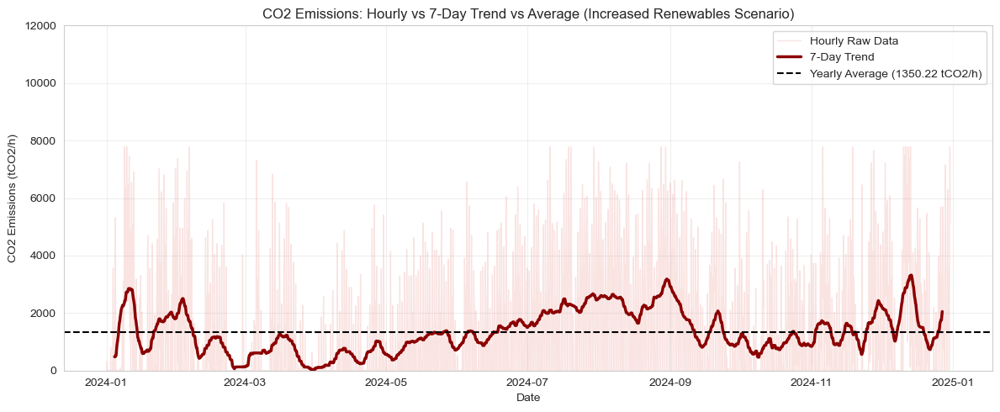

In [66]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Increased Renewables Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.ylim(0, 12000) 
plt.tight_layout()
plt.show()

### 2.6. Cost recovery

In [67]:
# Flow out for all gen techs in one go
dispatch_2 = (
    model_2.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch_2.head()


techs,nodes,timesteps,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,2024-01-01 00:00:00,0.0,8570.138480,1009.713600,4404.821169,7.617434e+02,7116.999999
1,NLD,2024-01-01 01:00:00,0.0,8243.438625,1027.387557,4404.821169,4.080193e+02,7116.999999
2,NLD,2024-01-01 02:00:00,0.0,7927.889315,982.868607,4404.821169,9.273192e-07,6717.504246
3,NLD,2024-01-01 03:00:00,0.0,7584.111715,891.359343,4404.821169,9.051896e-07,5987.374443
4,NLD,2024-01-01 04:00:00,0.0,7282.935865,823.699800,4404.821169,8.667876e-07,5625.709836


In [68]:
# Shadow price dataframe
balance_price_2 = (
    model_2.results.shadow_price_system_balance
    .to_series().reset_index()
)
balance_price_2

# Merge price into dispatch
df_2 = balance_price_2.merge(dispatch_2, on='timesteps', how='left')
df_2.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,power,2024-01-01 00:00:00,0.049768,NLD,0.0,8570.138480,1009.713600,4404.821169,7.617434e+02,7116.999999
1,NLD,power,2024-01-01 01:00:00,0.049768,NLD,0.0,8243.438625,1027.387557,4404.821169,4.080193e+02,7116.999999
2,NLD,power,2024-01-01 02:00:00,0.007627,NLD,0.0,7927.889315,982.868607,4404.821169,9.273192e-07,6717.504246
3,NLD,power,2024-01-01 03:00:00,0.007627,NLD,0.0,7584.111715,891.359343,4404.821169,9.051896e-07,5987.374443
4,NLD,power,2024-01-01 04:00:00,0.007627,NLD,0.0,7282.935865,823.699800,4404.821169,8.667876e-07,5625.709836


In [69]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df_2[f'{tech}_revenue'] = df_2[tech] * df_2['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue_2 = df_2[[f'{t}_revenue' for t in gen_techs]].sum()
revenue_2.index = revenue_2.index.str.replace('_revenue', '', regex=False)
revenue_2.name = 'revenue'
revenue_2

solar_pv         3.194859e+05
wind_onshore     1.969994e+06
wind_offshore    1.183629e+05
hydro            7.031882e+05
ccgt             1.579579e+06
nuclear          1.631934e+06
Name: revenue, dtype: float64

In [70]:
cost_2 = (
    model_2.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost_2 = cost_2.droplevel('costs')                # or just drop the level
cost_2.name = 'cost'
cost_2


techs
solar_pv         7.168373e+02
wind_onshore     1.390053e+05
wind_offshore    1.137641e+02
hydro            8.369113e+04
ccgt             1.401562e+06
nuclear          3.025406e+05
Name: cost, dtype: float64

In [71]:
# calculate profit and cost recovery ratio
covery_2 = pd.concat([revenue_2, cost_2], axis=1)
covery_2['profit'] = covery_2['revenue'] - covery_2['cost'] # >0 means revenue covers cost
covery_2['cost_recovery_ratio'] = covery_2['revenue'] / covery_2['cost']  # >1 means full recovery
covery_2

,revenue,cost,profit,cost_recovery_ratio
solar_pv,3.194859e+05,7.168373e+02,3.187690e+05,445.688099
wind_onshore,1.969994e+06,1.390053e+05,1.830989e+06,14.172077
wind_offshore,1.183629e+05,1.137641e+02,1.182492e+05,1040.424408
hydro,7.031882e+05,8.369113e+04,6.194971e+05,8.402184
ccgt,1.579579e+06,1.401562e+06,1.780171e+05,1.127013
nuclear,1.631934e+06,3.025406e+05,1.329393e+06,5.394097


In [72]:
covery_df_2 = covery_2.reset_index()
covery_df_2.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df_2

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,3.194859e+05,7.168373e+02,3.187690e+05,445.688099
1,wind_onshore,1.969994e+06,1.390053e+05,1.830989e+06,14.172077
2,wind_offshore,1.183629e+05,1.137641e+02,1.182492e+05,1040.424408
3,hydro,7.031882e+05,8.369113e+04,6.194971e+05,8.402184
4,ccgt,1.579579e+06,1.401562e+06,1.780171e+05,1.127013
5,nuclear,1.631934e+06,3.025406e+05,1.329393e+06,5.394097


[2025-12-16 18:22:03] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\562993365.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-16 18:22:03] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\562993365.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




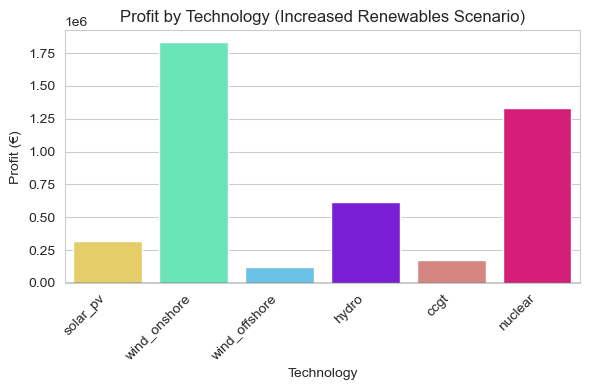

[2025-12-16 18:22:03] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\562993365.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





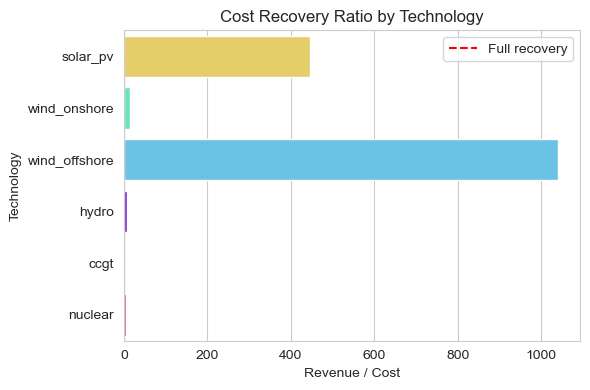

In [73]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_2,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Increased Renewables Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_2,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 3. Nuclear phase out
### 3.1 Reload the model with a scenario that forces a lower capacity of nuclear

In [74]:
model_3 = calliope.read_yaml('model/model.yaml',scenario='less_nuclear')

[2025-12-16 18:22:04] INFO     Loading overrides from scenario: less_nuclear 
[2025-12-16 18:22:04] INFO     (scenarios, less_nuclear ) | Applying the following overrides: ['lower_nuclear'].


[2025-12-16 18:22:04] INFO     Math init | loading pre-defined math.
[2025-12-16 18:22:04] INFO     Math init | loading math files {'operate', 'spores', 'storage_inter_cluster', 'milp', 'base'}.
[2025-12-16 18:22:04] INFO     Model: preprocessing data
[2025-12-16 18:22:04] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:22:04] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:04] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:04] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:04] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:04] INFO     Model: initialisation complete


In [75]:
model_3.build()
model_3.solve()

[2025-12-16 18:22:04] INFO     Model: backend build starting
[2025-12-16 18:22:05] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-16 18:22:06] INFO     Optimisation Model | variables | Generated.
[2025-12-16 18:22:07] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-16 18:22:13] INFO     Optimisation Model | constraints | Generated.
[2025-12-16 18:22:13] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-16 18:22:13] INFO     Optimisation Model | objectives | Generated.
[2025-12-16 18:22:13] INFO     Model: backend build complete
[2025-12-16 18:22:17] INFO     Optimisation model | starting model in base mode.
[2025-12-16 18:22:24] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmp4bbxcq2i.pyomo.lp
Reading time = 0.56 seconds
x1: 227753 rows, 140160 columns, 411707 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [76]:
model_3.to_netcdf('results/less_nuclear.nc')

### 3.2. Marginal technology

In [77]:
# Shadow price for the power system balance constraint
balance_price_3 = model_3.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price_3.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-01-01 00:00:00,0.049768
1,NLD,power,2024-01-01 01:00:00,0.049768
2,NLD,power,2024-01-01 02:00:00,0.049768
3,NLD,power,2024-01-01 03:00:00,0.049768
4,NLD,power,2024-01-01 04:00:00,0.049768


<Axes: >

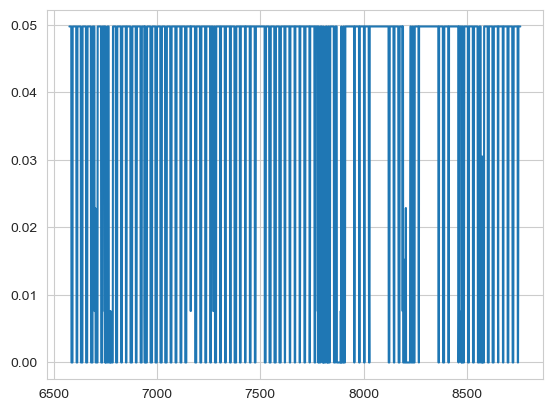

In [78]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price_3['system_balance'].loc[balance_price_3['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [79]:
variable_costs_3 = model_3.results.cost_operation_variable.to_series().dropna()
generation_3 = model_3.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs_3 = variable_costs_3/generation_3

# tranform to a DataFrame
marginal_generation_costs_3 = marginal_generation_costs_3.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs_3 = marginal_generation_costs_3.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs_3.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768


In [80]:
# Merge marginal generation costs with balance price
merged_3 = marginal_generation_costs_3.merge(
    balance_price_3,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged_3.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768,0.049768


In [81]:
merged_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  46071 non-null  float64       
 6   system_balance            61320 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [82]:
# turn system_balance and marginal_generation_cost into float type
merged_3['system_balance'] = merged_3['system_balance'].astype(float)
merged_3['marginal_generation_cost'] = merged_3['marginal_generation_cost'].astype(float)
merged_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  46071 non-null  float64       
 6   system_balance            61320 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [83]:
# Compute absolute difference between marginal cost and price
merged_3['diff'] = (merged_3['marginal_generation_cost'] - merged_3['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech_3 = (
    merged_3.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech_3.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-01-01 00:00:00,NLD,ccgt,0.049768,0.049768,4.918659e-10
1,2024-01-01 01:00:00,NLD,ccgt,0.049768,0.049768,5.346645e-10
2,2024-01-01 02:00:00,NLD,ccgt,0.049768,0.049768,6.731833e-10
3,2024-01-01 03:00:00,NLD,ccgt,0.049768,0.049768,8.648615e-10
4,2024-01-01 04:00:00,NLD,ccgt,0.049768,0.049768,1.006013e-09


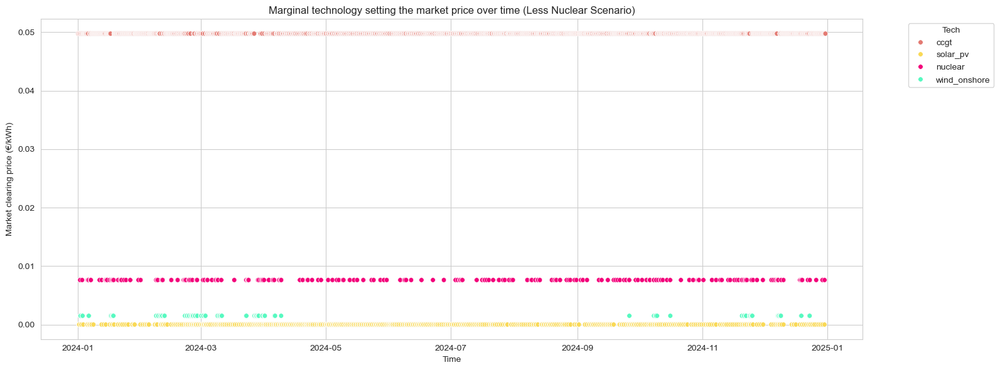

In [84]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_3,
    x='timesteps',
    y='marginal_generation_cost',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Less Nuclear Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [85]:
# Count how many hours each tech is marginal
freq = marginal_tech_3['techs'].value_counts().sort_values(ascending=False)
share = (freq / freq.sum()).rename('share')

share_df_3 = share.reset_index()
share_df_3.columns = ['techs', 'scenario_3']
share_df_3

,techs,scenario_3
0,ccgt,0.665068
1,solar_pv,0.271233
2,nuclear,0.033447
3,wind_onshore,0.030251


### 3.3. Dispatch per power plant type

In [86]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [87]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/less_nuclear.nc', plot_export_path='results/less_nuclear_dispatch.html')

[2025-12-16 18:22:30] INFO     Model: preprocessing data (reentry)
[2025-12-16 18:22:30] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:22:30] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:30] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:30] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:30] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:30] INFO     Model: initialisation complete


### 3.4.  Load, residual load and price duration curves

In [88]:
gen_techs = ['solar_pv','wind_onshore', 'hydro', 'ccgt', 'nuclear'] 

In [89]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model_3 = calliope.read_netcdf('results/less_nuclear.nc')

[2025-12-16 18:22:31] INFO     Model: preprocessing data (reentry)
[2025-12-16 18:22:31] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:22:32] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:32] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:32] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:32] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:32] INFO     Model: initialisation complete


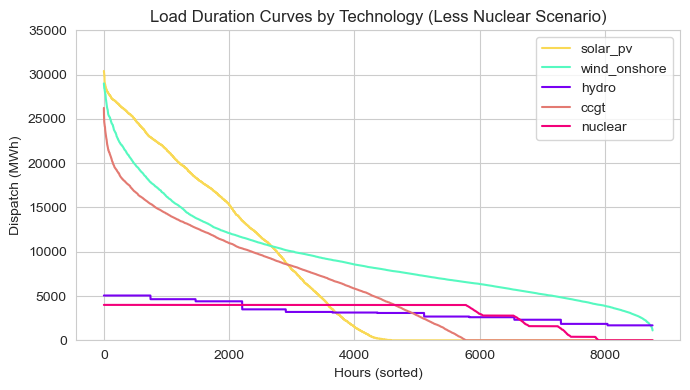

In [90]:
dispatch = {}
for tech in gen_techs:
    series = (
        model_3.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Less Nuclear Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.ylim(0, 35000) 
plt.tight_layout()
plt.show()

In [91]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price_3['system_balance'].to_frame(), 
                         plot_export_path='results/less_nuclear_price.html', 
                         y_label='Price (EUR/kWh)')

In [92]:
# Obtain demand from input
demand_3 = model_3.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch_3 = model_3.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch_3 = model_3.results.flow_out.sel(techs='wind_onshore').to_series().dropna()
# Calculate the residual load (load minus renewable generation)
residual_load_3 = demand_3 - (solar_pv_dispatch_3 + wind_onshore_dispatch_3)
residual_load_3.head()

timesteps            nodes  carriers
2024-01-01 00:00:00  NLD    power       14227.213915
2024-01-01 01:00:00  NLD    power       13855.561467
2024-01-01 02:00:00  NLD    power       12969.140277
2024-01-01 03:00:00  NLD    power       12110.037851
2024-01-01 04:00:00  NLD    power       11647.892891
dtype: float64

In [93]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load_3.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/less_nuclear_residual_load.html',
                         y_label='Residual Load (MWh)')


### 3.5. CO2 emissions

In [94]:
# to get hourly generation for all techs, power carrier only
power_gen_3 = model_3.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [95]:
# change to dataframe
gen_df_3 = power_gen_3.to_series().reset_index()

# find average generation for each tech
avg_gen_3 = gen_df_3.groupby('techs')['flow_out'].mean().reset_index()
avg_gen_3 = avg_gen_3.rename(columns={'flow_out': 'avg_generation_3'})
avg_gen_3

,techs,avg_generation_3
0,ccgt,5970.412013
1,curtailment,NaN
2,demand_power,NaN
3,hydro,3184.593879
4,load_shedding,0.000031
5,nuclear,3088.976583
6,solar_pv,6826.125109
7,wind_offshore,0.000000
8,wind_onshore,9375.956147


In [96]:
 # find total generation for each tech
total_gen_3 = gen_df_3.groupby('techs')['flow_out'].sum().reset_index()
total_gen_3 = total_gen_3.rename(columns={'flow_out': 'total_generation_3'})
total_gen_3

,techs,total_generation_3
0,ccgt,5.230081e+07
1,curtailment,0.000000e+00
2,demand_power,0.000000e+00
3,hydro,2.789704e+07
4,load_shedding,2.679134e-01
5,nuclear,2.705943e+07
6,solar_pv,5.979686e+07
7,wind_offshore,0.000000e+00
8,wind_onshore,8.213338e+07


In [97]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [98]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen_3.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [99]:
# Total across all emitting techs
total_emissions_t_3 = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t_3:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t_3/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 21,966,339.88 tCO2

Total CO2 emissions: 21,966,339.88 tCO2
Total CO2 emissions: 21.966 MtCO2


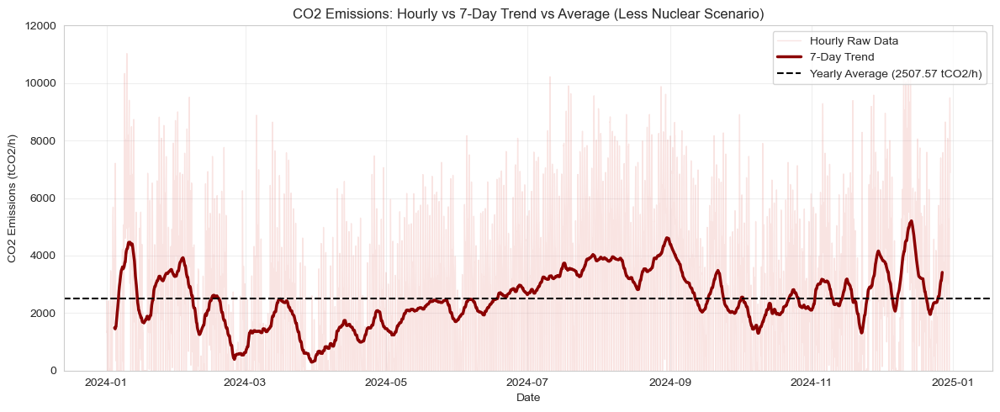

In [100]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Less Nuclear Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.ylim(0, 12000) 
plt.tight_layout()
plt.show()

### 3.6. Cost recovery

In [101]:
# Flow out for all gen techs in one go
dispatch_3 = (
    model_3.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch_3.head()


techs,nodes,timesteps,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,2024-01-01 00:00:00,0.0,7636.202752,4404.821169,5822.393066,3999.999804
1,NLD,2024-01-01 01:00:00,0.0,7345.105200,4404.821169,5450.740618,3999.999804
2,NLD,2024-01-01 02:00:00,0.0,7063.943056,4404.821169,4564.319428,3999.999804
3,NLD,2024-01-01 03:00:00,0.0,6757.628816,4404.821169,3705.217002,3999.999804
4,NLD,2024-01-01 04:00:00,0.0,6489.273776,4404.821169,3243.072042,3999.999804


In [102]:
# Shadow price dataframe
balance_price_3 = (
    model_3.results.shadow_price_system_balance
    .to_series().reset_index()
)

# Merge price into dispatch
df = balance_price_3.merge(dispatch_3, on='timesteps', how='left')
df.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,power,2024-01-01 00:00:00,0.049768,NLD,0.0,7636.202752,4404.821169,5822.393066,3999.999804
1,NLD,power,2024-01-01 01:00:00,0.049768,NLD,0.0,7345.105200,4404.821169,5450.740618,3999.999804
2,NLD,power,2024-01-01 02:00:00,0.049768,NLD,0.0,7063.943056,4404.821169,4564.319428,3999.999804
3,NLD,power,2024-01-01 03:00:00,0.049768,NLD,0.0,6757.628816,4404.821169,3705.217002,3999.999804
4,NLD,power,2024-01-01 04:00:00,0.049768,NLD,0.0,6489.273776,4404.821169,3243.072042,3999.999804


In [103]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df[f'{tech}_revenue'] = df[tech] * df['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue = df[[f'{t}_revenue' for t in gen_techs]].sum()
revenue.index = revenue.index.str.replace('_revenue', '', regex=False)
revenue.name = 'revenue'
revenue

solar_pv        6.710693e+05
wind_onshore    2.446817e+06
hydro           9.108971e+05
ccgt            2.602929e+06
nuclear         1.169825e+06
Name: revenue, dtype: float64

In [104]:
cost_3 = (
    model_3.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost_3 = cost_3.droplevel('costs')                # or just drop the level
cost_3.name = 'cost'
cost_3


techs
solar_pv        6.338467e+02
wind_onshore    1.238571e+05
hydro           8.369113e+04
ccgt            2.602929e+06
nuclear         2.063897e+05
Name: cost, dtype: float64

In [105]:
# calculate profit and cost recovery ratio
covery_3 = pd.concat([revenue, cost_3], axis=1)
covery_3['profit'] = covery_3['revenue'] - covery_3['cost'] # >0 means revenue covers cost
covery_3['cost_recovery_ratio'] = covery_3['revenue'] / covery_3['cost']  # >1 means full recovery
covery_3

,revenue,cost,profit,cost_recovery_ratio
solar_pv,6.710693e+05,6.338467e+02,6.704354e+05,1058.724934
wind_onshore,2.446817e+06,1.238571e+05,2.322960e+06,19.755160
hydro,9.108971e+05,8.369113e+04,8.272060e+05,10.884034
ccgt,2.602929e+06,2.602929e+06,-3.553634e-02,1.000000
nuclear,1.169825e+06,2.063897e+05,9.634349e+05,5.668038


In [106]:
covery_df_3 = covery_3.reset_index()
covery_df_3.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df_3

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,6.710693e+05,6.338467e+02,6.704354e+05,1058.724934
1,wind_onshore,2.446817e+06,1.238571e+05,2.322960e+06,19.755160
2,hydro,9.108971e+05,8.369113e+04,8.272060e+05,10.884034
3,ccgt,2.602929e+06,2.602929e+06,-3.553634e-02,1.000000
4,nuclear,1.169825e+06,2.063897e+05,9.634349e+05,5.668038


[2025-12-16 18:22:33] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\1941397725.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-16 18:22:33] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\1941397725.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




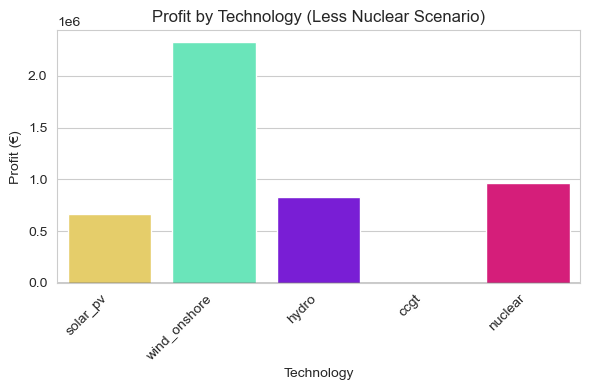

[2025-12-16 18:22:33] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\1941397725.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





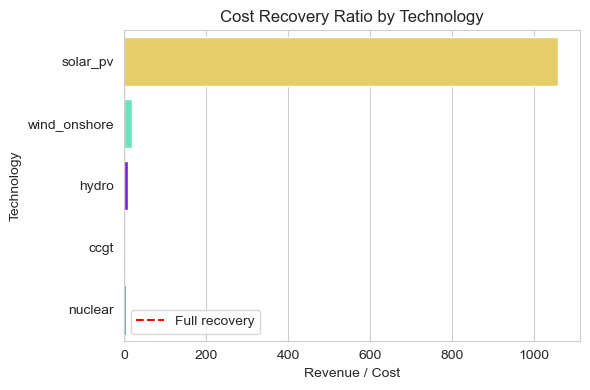

In [107]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_3,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Less Nuclear Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_3,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 4. Combine increasing renewables and nuclear phase out
### 4.1 Reload the model with a scenario that forces a higher renewables and lower capacity of nuclear

In [108]:
model_4 = calliope.read_yaml('model/model.yaml',scenario='combination')

[2025-12-16 18:22:33] INFO     Loading overrides from scenario: combination 
[2025-12-16 18:22:33] INFO     (scenarios, combination ) | Applying the following overrides: ['lower_nuclear', 'higher_renewables'].
[2025-12-16 18:22:33] INFO     Math init | loading pre-defined math.
[2025-12-16 18:22:33] INFO     Math init | loading math files {'operate', 'spores', 'storage_inter_cluster', 'milp', 'base'}.
[2025-12-16 18:22:33] INFO     Model: preprocessing data
[2025-12-16 18:22:33] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:22:34] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:34] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:34] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:34] INFO     input data `name` not d

In [109]:
model_4.build()
model_4.solve()

[2025-12-16 18:22:34] INFO     Model: backend build starting
[2025-12-16 18:22:35] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-16 18:22:35] INFO     Optimisation Model | variables | Generated.
[2025-12-16 18:22:37] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-16 18:22:42] INFO     Optimisation Model | constraints | Generated.
[2025-12-16 18:22:42] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-16 18:22:42] INFO     Optimisation Model | objectives | Generated.
[2025-12-16 18:22:42] INFO     Model: backend build complete
[2025-12-16 18:22:47] INFO     Optimisation model | starting model in base mode.
[2025-12-16 18:22:52] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmp93qbab9_.pyomo.lp
Reading time = 0.55 seconds
x1: 227753 rows, 140160 columns, 411707 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [110]:
model_4.to_netcdf('results/combination.nc')

### 4.2. Marginal technology

In [111]:
# Shadow price for the power system balance constraint
balance_price_4 = model_4.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price_4.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-01-01 00:00:00,0.049768
1,NLD,power,2024-01-01 01:00:00,0.049768
2,NLD,power,2024-01-01 02:00:00,0.049768
3,NLD,power,2024-01-01 03:00:00,0.049768
4,NLD,power,2024-01-01 04:00:00,0.049768


<Axes: >

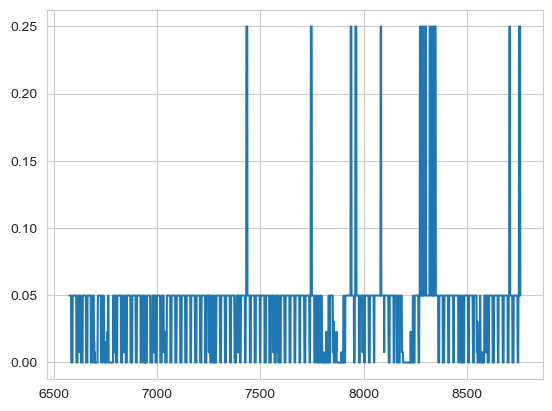

In [112]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price_4['system_balance'].loc[balance_price_4['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [113]:
variable_costs_4 = model_4.results.cost_operation_variable.to_series().dropna()
generation_4 = model_4.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs_4 = variable_costs_4/generation_4

# tranform to a DataFrame
marginal_generation_costs_4 = marginal_generation_costs_4.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs_4 = marginal_generation_costs_4.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs_4.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768


In [114]:
# Merge marginal generation costs with balance price
merged_4 = marginal_generation_costs_4.merge(
    balance_price_4,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged_4.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768,0.049768


In [115]:
merged_4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  54297 non-null  float64       
 6   system_balance            61320 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [116]:
# turn system_balance and marginal_generation_cost into float type
merged_4['system_balance'] = merged_4['system_balance'].astype(float)
merged_4['marginal_generation_cost'] = merged_4['marginal_generation_cost'].astype(float)
merged_4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  54297 non-null  float64       
 6   system_balance            61320 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [117]:
# Compute absolute difference between marginal cost and price
merged_4['diff'] = (merged_4['marginal_generation_cost'] - merged_4['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech_4 = (
    merged_4.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech_4.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-01-01 00:00:00,NLD,ccgt,0.049768,0.049768,3.333890e-10
1,2024-01-01 01:00:00,NLD,ccgt,0.049768,0.049768,3.809043e-10
2,2024-01-01 02:00:00,NLD,ccgt,0.049768,0.049768,5.465604e-10
3,2024-01-01 03:00:00,NLD,ccgt,0.049768,0.049768,7.982515e-10
4,2024-01-01 04:00:00,NLD,ccgt,0.049768,0.049768,9.991147e-10


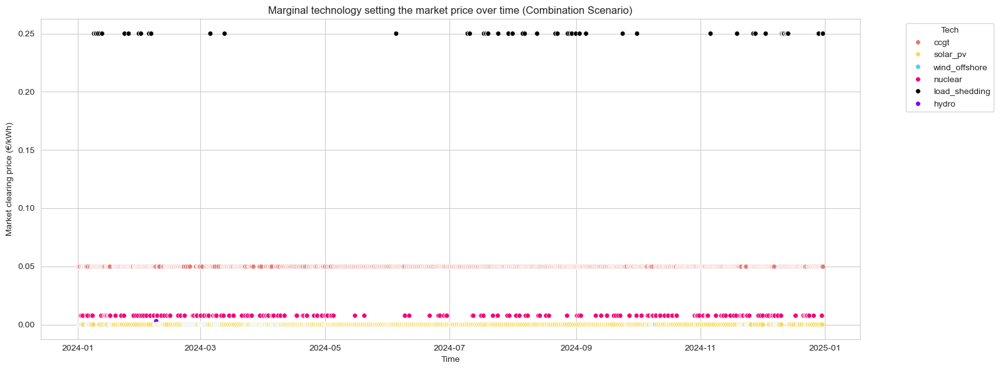

In [118]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_4,
    x='timesteps',
    y='marginal_generation_cost',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Combination Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [119]:
# Count how many hours each tech is marginal
freq = marginal_tech_4['techs'].value_counts().sort_values(ascending=False)
share = (freq / freq.sum()).rename('share')

share_df_4 = share.reset_index()
share_df_4.columns = ['techs', 'scenario_4']
share_df_4

,techs,scenario_4
0,ccgt,0.564612
1,solar_pv,0.322489
2,wind_offshore,0.051712
3,nuclear,0.041553
4,load_shedding,0.019521
5,hydro,0.000114


### 4.3. Dispatch per power plant type

In [120]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [121]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/combination.nc', plot_export_path='results/combination.html')

[2025-12-16 18:22:59] INFO     Model: preprocessing data (reentry)
[2025-12-16 18:22:59] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:22:59] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:22:59] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:23:00] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:23:00] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:23:00] INFO     Model: initialisation complete


### 4.4.  Load, residual load and price duration curves

In [122]:
gen_techs = ['solar_pv','wind_onshore', 'wind_offshore', 'hydro', 'ccgt', 'nuclear'] 

In [123]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model_4 = calliope.read_netcdf('results/combination.nc')

[2025-12-16 18:23:00] INFO     Model: preprocessing data (reentry)
[2025-12-16 18:23:00] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-16 18:23:00] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:23:00] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:23:00] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:23:00] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-16 18:23:00] INFO     Model: initialisation complete


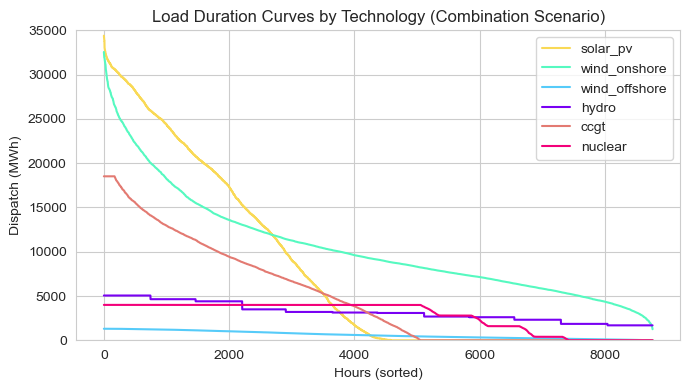

In [124]:
dispatch = {}
for tech in gen_techs:
    series = (
        model_4.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Combination Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.ylim(0, 35000) 
plt.tight_layout()
plt.show()

In [125]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price_4['system_balance'].to_frame(), 
                         plot_export_path='results/combination_price.html', 
                         y_label='Price (EUR/kWh)')

In [126]:
# Obtain demand from input
demand_4 = model_4.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch_4 = model_4.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch_4 = model_4.results.flow_out.sel(techs='wind_onshore').to_series().dropna()
wind_offshore_dispatch_4 = model_4.results.flow_out.sel(techs='wind_offshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load_4 = demand_4 - (solar_pv_dispatch_4 + wind_onshore_dispatch_4 + wind_offshore_dispatch_4)
residual_load_4.head()

timesteps            nodes  carriers
2024-01-01 00:00:00  NLD    power       12283.564587
2024-01-01 01:00:00  NLD    power       11929.840485
2024-01-01 02:00:00  NLD    power       11122.325411
2024-01-01 03:00:00  NLD    power       10392.195609
2024-01-01 04:00:00  NLD    power       10030.531002
dtype: float64

In [127]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load_4.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/combination_residual_load.html',
                         y_label='Residual Load (MWh)')


### 4.5. CO2 emissions

In [128]:
# to get hourly generation for all techs, power carrier only
power_gen_4 = model_4.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [129]:
# change to dataframe
gen_df_4 = power_gen_4.to_series().reset_index()

# find average generation for each tech
avg_gen_4 = gen_df_4.groupby('techs')['flow_out'].mean().reset_index()
avg_gen_4 = avg_gen_4.rename(columns={'flow_out': 'avg_generation_4'})
avg_gen_4

,techs,avg_generation_4
0,ccgt,4833.213143
1,curtailment,NaN
2,demand_power,NaN
3,hydro,3184.593879
4,load_shedding,40.625209
5,nuclear,2799.553076
6,solar_pv,7719.881531
7,wind_offshore,612.583352
8,wind_onshore,10522.670124


In [130]:
 # find total generation for each tech
total_gen_4 = gen_df_4.groupby('techs')['flow_out'].sum().reset_index()
total_gen_4 = total_gen_4.rename(columns={'flow_out': 'total_generation_4'})
total_gen_4

,techs,total_generation_4
0,ccgt,4.233895e+07
1,curtailment,0.000000e+00
2,demand_power,0.000000e+00
3,hydro,2.789704e+07
4,load_shedding,3.558768e+05
5,nuclear,2.452408e+07
6,solar_pv,6.762616e+07
7,wind_offshore,5.366230e+06
8,wind_onshore,9.217859e+07


In [131]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [132]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen_4.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [133]:
# Total across all emitting techs
total_emissions_t_4 = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t_4:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t_4/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 17,782,357.79 tCO2

Total CO2 emissions: 17,782,357.79 tCO2
Total CO2 emissions: 17.782 MtCO2


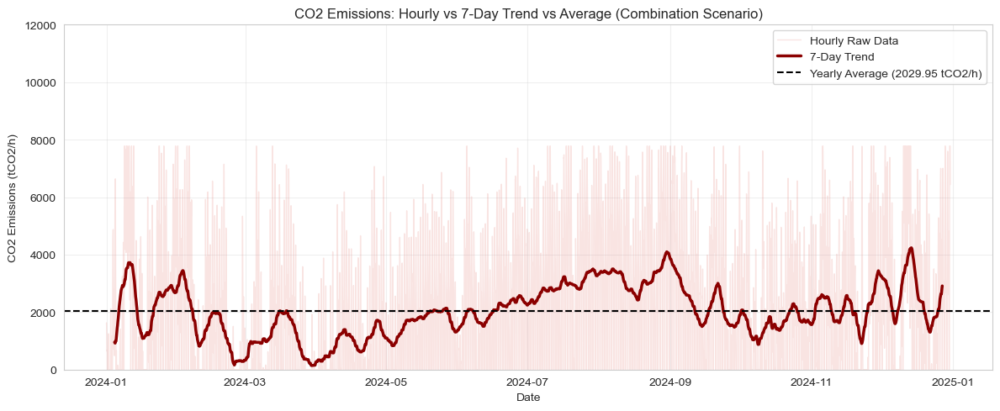

In [134]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Combination Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.ylim(0, 12000) 
plt.tight_layout()
plt.show()

### 4.6. Cost recovery

In [135]:
# Flow out for all gen techs in one go
dispatch = (
    model_4.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch.head()


techs,nodes,timesteps,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,2024-01-01 00:00:00,0.0,8570.138480,1009.713600,4404.821169,3878.743527,3999.999933
1,NLD,2024-01-01 01:00:00,0.0,8243.438625,1027.387557,4404.821169,3525.019425,3999.999933
2,NLD,2024-01-01 02:00:00,0.0,7927.889315,982.868607,4404.821169,2717.504352,3999.999933
3,NLD,2024-01-01 03:00:00,0.0,7584.111715,891.359343,4404.821169,1987.374549,3999.999933
4,NLD,2024-01-01 04:00:00,0.0,7282.935865,823.699800,4404.821169,1625.709942,3999.999933


In [136]:
# Shadow price dataframe
balance_price_4 = (
    model_4.results.shadow_price_system_balance
    .to_series().reset_index()
)

# Merge price into dispatch
df_4 = balance_price_4.merge(dispatch, on='timesteps', how='left')
df_4.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,power,2024-01-01 00:00:00,0.049768,NLD,0.0,8570.138480,1009.713600,4404.821169,3878.743527,3999.999933
1,NLD,power,2024-01-01 01:00:00,0.049768,NLD,0.0,8243.438625,1027.387557,4404.821169,3525.019425,3999.999933
2,NLD,power,2024-01-01 02:00:00,0.049768,NLD,0.0,7927.889315,982.868607,4404.821169,2717.504352,3999.999933
3,NLD,power,2024-01-01 03:00:00,0.049768,NLD,0.0,7584.111715,891.359343,4404.821169,1987.374549,3999.999933
4,NLD,power,2024-01-01 04:00:00,0.049768,NLD,0.0,7282.935865,823.699800,4404.821169,1625.709942,3999.999933


In [137]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df_4[f'{tech}_revenue'] = df_4[tech] * df_4['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue_4 = df_4[[f'{t}_revenue' for t in gen_techs]].sum()
revenue_4.index = revenue_4.index.str.replace('_revenue', '', regex=False)
revenue_4.name = 'revenue'
revenue_4

solar_pv         4.815934e+05
wind_onshore     2.497171e+06
wind_offshore    1.514442e+05
hydro            8.942577e+05
ccgt             2.741328e+06
nuclear          1.164686e+06
Name: revenue, dtype: float64

In [138]:
cost_4 = (
    model_4.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost_4 = cost_4.droplevel('costs')                # or just drop the level
cost_4.name = 'cost'
cost_4

techs
solar_pv         7.168373e+02
wind_onshore     1.390053e+05
wind_offshore    1.137641e+02
hydro            8.369113e+04
ccgt             2.107143e+06
nuclear          1.870519e+05
Name: cost, dtype: float64

In [139]:
# calculate profit and cost recovery ratio
covery_4 = pd.concat([revenue_4, cost_4], axis=1)
covery_4['profit'] = covery_4['revenue'] - covery_4['cost'] # >0 means revenue covers cost
covery_4['cost_recovery_ratio'] = covery_4['revenue'] / covery_4['cost']  # >1 means full recovery
covery_4

,revenue,cost,profit,cost_recovery_ratio
solar_pv,4.815934e+05,7.168373e+02,4.808765e+05,671.830766
wind_onshore,2.497171e+06,1.390053e+05,2.358165e+06,17.964569
wind_offshore,1.514442e+05,1.137641e+02,1.513304e+05,1331.212641
hydro,8.942577e+05,8.369113e+04,8.105666e+05,10.685215
ccgt,2.741328e+06,2.107143e+06,6.341859e+05,1.300970
nuclear,1.164686e+06,1.870519e+05,9.776337e+05,6.226537


In [140]:
covery_df_4 = covery_4.reset_index()
covery_df_4.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df_4

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,4.815934e+05,7.168373e+02,4.808765e+05,671.830766
1,wind_onshore,2.497171e+06,1.390053e+05,2.358165e+06,17.964569
2,wind_offshore,1.514442e+05,1.137641e+02,1.513304e+05,1331.212641
3,hydro,8.942577e+05,8.369113e+04,8.105666e+05,10.685215
4,ccgt,2.741328e+06,2.107143e+06,6.341859e+05,1.300970
5,nuclear,1.164686e+06,1.870519e+05,9.776337e+05,6.226537


[2025-12-16 18:23:02] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\4220533698.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-16 18:23:02] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\4220533698.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




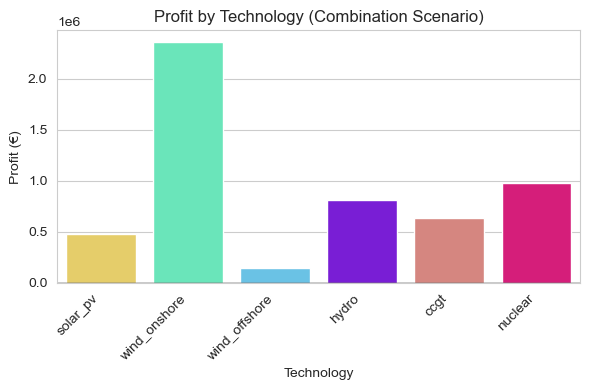

[2025-12-16 18:23:02] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\4220533698.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





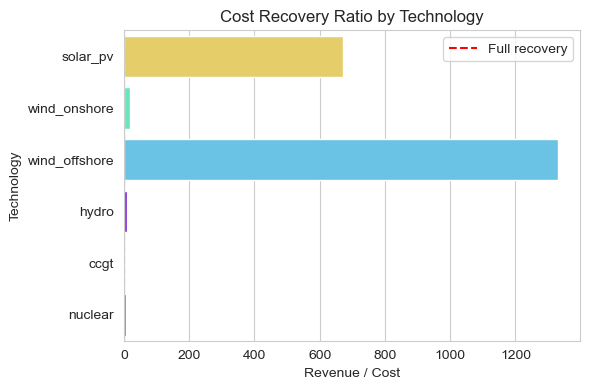

In [141]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_4,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Combination Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_4,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 5. Comparison across scenarios

### 5.1 Marginal tech

In [142]:
# mergemarginal share dataframes from all scenarios
merged_share_df = share_df_1.merge(share_df_2, on='techs', how='outer') \
                             .merge(share_df_3, on='techs', how='outer') \
                             .merge(share_df_4, on='techs', how='outer')
merged_share_df

,techs,scenario_1,scenario_2,scenario_3,scenario_4
0,ccgt,0.569178,0.484703,0.665068,0.564612
1,hydro,NaN,NaN,NaN,0.000114
2,load_shedding,NaN,0.005479,NaN,0.019521
3,nuclear,0.100342,0.113584,0.033447,0.041553
4,solar_pv,0.300457,0.345662,0.271233,0.322489
5,wind_offshore,NaN,0.050571,NaN,0.051712
6,wind_onshore,0.030023,NaN,0.030251,NaN


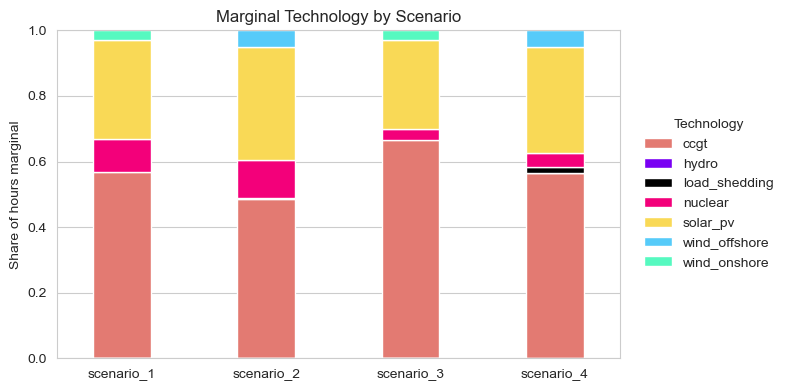

In [143]:
merged_share_df = merged_share_df.set_index('techs').fillna(0)
colors = [tech_colors[tech] for tech in merged_share_df.index]

fig, ax = plt.subplots(figsize=(8, 4))
merged_share_df.T.plot(
    kind="bar",
    stacked=True,
    ax=ax,
    width=0.4,
    color=colors
)

ax.set_ylabel("Share of hours marginal")
ax.set_title("Marginal Technology by Scenario")

ax.set_ylim(0, 1)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

ax.legend(
    title="Technology",
    bbox_to_anchor=(1.02, 0.5),
    loc="center left",
    frameon=False
)

plt.tight_layout()
plt.show()

### 5.2 Price duration curve

In [144]:
# merge shadow price dataframes from all scenarios
merged_price_df = balance_price_1[['timesteps', 'shadow_price_system_balance']].rename(columns={'shadow_price_system_balance':'scenario_1'}) \
                             .merge(balance_price_2[['timesteps', 'shadow_price_system_balance']].rename(columns={'shadow_price_system_balance':'scenario_2'}), on='timesteps', how='outer') \
                             .merge(balance_price_3[['timesteps', 'shadow_price_system_balance']].rename(columns={'shadow_price_system_balance':'scenario_3'}), on='timesteps', how='outer') \
                             .merge(balance_price_4[['timesteps', 'shadow_price_system_balance']].rename(columns={'shadow_price_system_balance':'scenario_4'}), on='timesteps', how='outer')
merged_price_df

,timesteps,scenario_1,scenario_2,scenario_3,scenario_4
0,2024-01-01 00:00:00,0.049768,0.049768,0.049768,0.049768
1,2024-01-01 01:00:00,0.049768,0.049768,0.049768,0.049768
2,2024-01-01 02:00:00,0.049768,0.007627,0.049768,0.049768
3,2024-01-01 03:00:00,0.049768,0.007627,0.049768,0.049768
4,2024-01-01 04:00:00,0.049768,0.007627,0.049768,0.049768
...,...,...,...,...,...
8755,2024-12-30 19:00:00,0.049768,0.250000,0.049768,0.250000
8756,2024-12-30 20:00:00,0.049768,0.250000,0.049768,0.250000
8757,2024-12-30 21:00:00,0.049768,0.049768,0.049768,0.250000
8758,2024-12-30 22:00:00,0.049768,0.049768,0.049768,0.250000


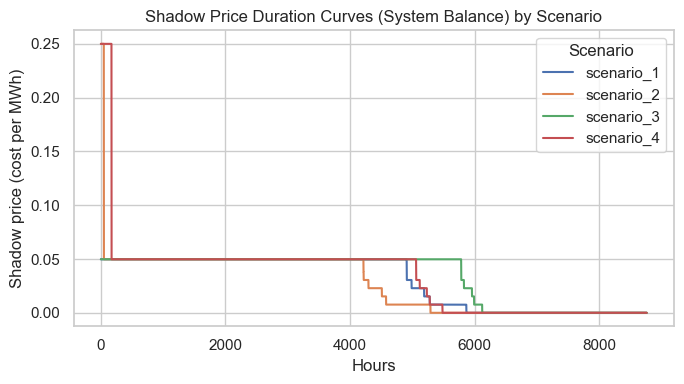

In [145]:
# Price duration curves (shadow price of system_balance) for all scenarios
price_cols = [c for c in merged_price_df.columns if c != "timesteps"]

curves = []
for c in price_cols:
    s = (
        merged_price_df[c]
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    curves.append(pd.DataFrame({
        "hour_rank": range(1, len(s) + 1),
        "shadow_price": s.values,
        "scenario": c
    }))

price_ldc = pd.concat(curves, ignore_index=True)

sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(7, 4))
sns.lineplot(data=price_ldc, x="hour_rank", y="shadow_price", hue="scenario", ax=ax)

ax.set_title("Shadow Price Duration Curves (System Balance) by Scenario")
ax.set_xlabel("Hours")
ax.set_ylabel("Shadow price (cost per MWh)")
ax.legend(title="Scenario")

plt.tight_layout()
plt.show()


### 5.3 Residual load duration curve

In [146]:
residual_load_df_1 = residual_load_1.reset_index(name="residual_load")
residual_load_df_2 = residual_load_2.reset_index(name="residual_load")
residual_load_df_3 = residual_load_3.reset_index(name="residual_load")
residual_load_df_4 = residual_load_4.reset_index(name="residual_load")

# merge residual load dataframes from all scenarios
merged_residual_load_df = residual_load_df_1[['timesteps', 'residual_load']].rename(columns={'residual_load':'scenario_1'}) \
                             .merge(residual_load_df_2[['timesteps', 'residual_load']].rename(columns={'residual_load':'scenario_2'}), on='timesteps', how='outer') \
                             .merge(residual_load_df_3[['timesteps', 'residual_load']].rename(columns={'residual_load':'scenario_3'}), on='timesteps', how='outer') \
                             .merge(residual_load_df_4[['timesteps', 'residual_load']].rename(columns={'residual_load':'scenario_4'}), on='timesteps', how='outer')
merged_residual_load_df


,timesteps,scenario_1,scenario_2,scenario_3,scenario_4
0,2024-01-01 00:00:00,14227.213915,12283.564587,14227.213915,12283.564587
1,2024-01-01 01:00:00,13855.561467,11929.840485,13855.561467,11929.840485
2,2024-01-01 02:00:00,12969.140277,11122.325411,12969.140277,11122.325411
3,2024-01-01 03:00:00,12110.037851,10392.195609,12110.037851,10392.195609
4,2024-01-01 04:00:00,11647.892891,10030.531002,11647.892891,10030.531002
...,...,...,...,...,...
8755,2024-12-30 19:00:00,29267.915893,28821.286108,29267.915893,28821.286108
8756,2024-12-30 20:00:00,29219.633728,28643.210709,29219.633728,28643.210709
8757,2024-12-30 21:00:00,28503.851099,27762.545692,28503.851099,27762.545692
8758,2024-12-30 22:00:00,26121.778293,25210.408018,26121.778293,25210.408018


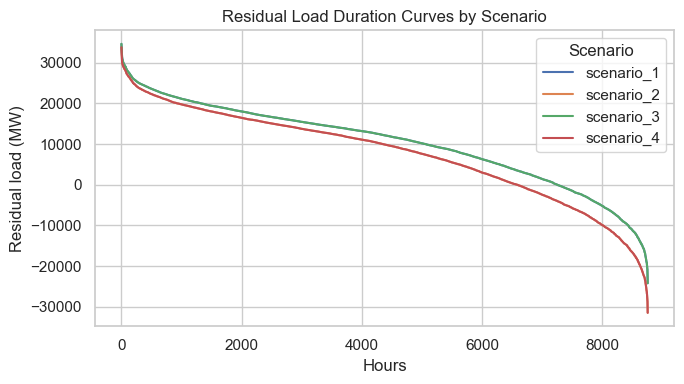

In [147]:
# Residual load duration curves for all scenarios
residual_cols = [c for c in merged_residual_load_df.columns if c != "timesteps"]

curves = []
for c in residual_cols:
    s = (
        merged_residual_load_df[c]
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    curves.append(pd.DataFrame({
        "hour_rank": range(1, len(s) + 1),
        "residual_load": s.values,
        "scenario": c
    }))

residual_ldc = pd.concat(curves, ignore_index=True)

sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize=(7, 4))
sns.lineplot(data=residual_ldc, x="hour_rank", y="residual_load", hue="scenario", ax=ax)

ax.set_title("Residual Load Duration Curves by Scenario")
ax.set_xlabel("Hours")
ax.set_ylabel("Residual load (MW)")
ax.legend(title="Scenario")

plt.tight_layout()
plt.show()

### 5.4 Profits by technology and scenario

In [148]:
# select techs and profit columns from each scenario
profit_df_1 = covery_df_1[['techs', 'profit']].rename(columns={'profit':'scenario_1'})
profit_df_2 = covery_df_2[['techs', 'profit']].rename(columns={'profit':'scenario_2'})
profit_df_3 = covery_df_3[['techs', 'profit']].rename(columns={'profit':'scenario_3'})
profit_df_4 = covery_df_4[['techs', 'profit']].rename(columns={'profit':'scenario_4'})

# merge profit dataframes from all scenarios
merged_profit_df = profit_df_1.merge(profit_df_2, on='techs', how='outer') \
                             .merge(profit_df_3, on='techs', how='outer') \
                             .merge(profit_df_4, on='techs', how='outer')   

merged_profit_df

,techs,scenario_1,scenario_2,scenario_3,scenario_4
0,ccgt,-2.739328e-02,1.780171e+05,-3.553634e-02,6.341859e+05
1,hydro,7.033709e+05,6.194971e+05,8.272060e+05,8.105666e+05
2,nuclear,1.469260e+06,1.329393e+06,9.634349e+05,9.776337e+05
3,solar_pv,4.405285e+05,3.187690e+05,6.704354e+05,4.808765e+05
4,wind_offshore,NaN,1.182492e+05,NaN,1.513304e+05
5,wind_onshore,1.940697e+06,1.830989e+06,2.322960e+06,2.358165e+06


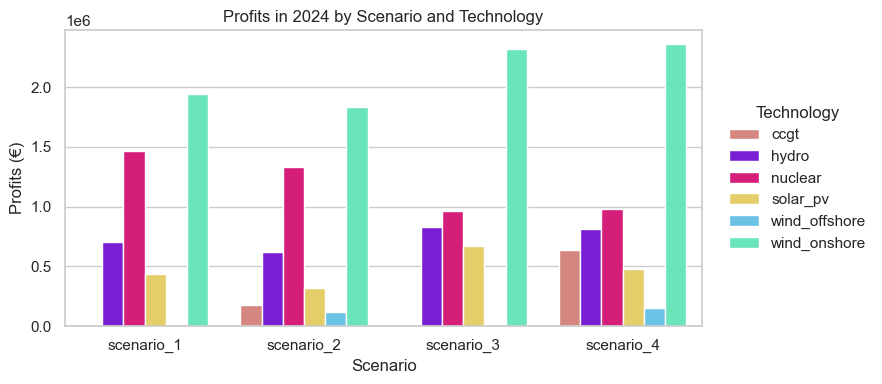

In [149]:
merged_profit_melted = merged_profit_df.melt(id_vars='techs', var_name='scenario', value_name='Profits (€)')
fig, ax = plt.subplots(figsize=(9, 4))

sns.barplot(
    data=merged_profit_melted,
    x='scenario',
    y='Profits (€)',
    hue='techs',
    palette=tech_colors,   # 👈 your predefined colors
    ax=ax
)

ax.set_title("Profits in 2024 by Scenario and Technology")
ax.set_ylabel("Profits (€)")
ax.set_xlabel("Scenario")

ax.legend(
    title='Technology',
    bbox_to_anchor=(1.02, 0.5),
    loc='center left',
    frameon=False
)

plt.tight_layout()
plt.show()


### 5.5 Average generation and total generation per technology

##### Average Generation Comparison

In [150]:
# merge average generation dataframes from all scenarios
avg_gen_all = avg_gen_1.merge(avg_gen_2, on='techs').merge(avg_gen_3, on='techs').merge(avg_gen_4, on='techs').dropna()

# rename columns
avg_gen_all = avg_gen_all.rename(columns={'avg_generation_1':'scenario_1',
                                          'avg_generation_2':'scenario_2',
                                          'avg_generation_3':'scenario_3',
                                          'avg_generation_4':'scenario_4'})
                                    
avg_gen_all

,techs,scenario_1,scenario_2,scenario_3,scenario_4
0,ccgt,4062.403138,3214.802142,5970.412013,4833.213143
3,hydro,3184.593879,3184.593879,3184.593879,3184.593879
4,load_shedding,0.000004,6.051170,0.000031,40.625209
5,nuclear,5067.224038,4528.041016,3088.976583,2799.553076
6,solar_pv,6826.125109,7719.881531,6826.125109,7719.881531
7,wind_offshore,0.000000,612.583352,0.000000,612.583352
8,wind_onshore,9375.956147,10522.670124,9375.956147,10522.670124


[2025-12-16 18:23:03] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_24080\4074114496.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




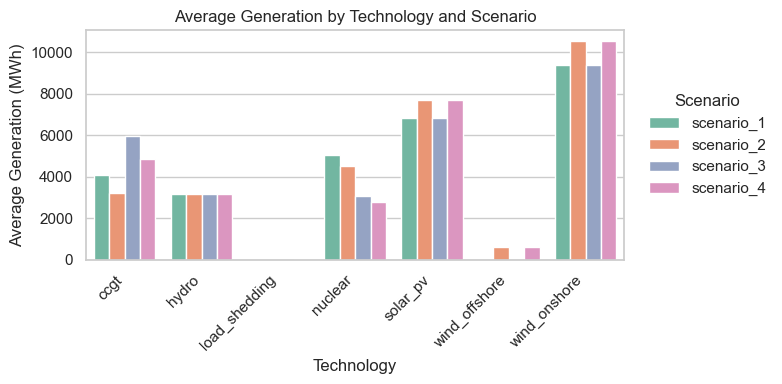

In [151]:
# plot average generation by tech and scenario
avg_gen_melted = avg_gen_all.melt(id_vars='techs', var_name='scenario', value_name='avg_generation')
fig, ax = plt.subplots(figsize=(8, 4))
sns.barplot(
    data=avg_gen_melted,
    x='techs',
    y='avg_generation',
    hue='scenario',
    palette='Set2',
    ax=ax
)
ax.set_title("Average Generation by Technology and Scenario")
ax.set_ylabel("Average Generation (MWh)")
ax.set_xlabel("Technology")
ax.legend(title='Scenario', bbox_to_anchor=(1.02, 0.5), loc='center left', frameon=False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()

##### Total Generation Comparison

In [152]:
total_gen_all = total_gen_1.merge(total_gen_2, on='techs').merge(total_gen_3, on='techs').merge(total_gen_4, on='techs').dropna()

# rename columns
total_gen_all = total_gen_all.rename(columns={'total_generation_1':'scenario_1',
                                          'total_generation_2':'scenario_2',
                                          'total_generation_3':'scenario_3',
                                          'total_generation_4':'scenario_4'})

# drop techs with zero total generation across all scenarios
total_gen_all = total_gen_all[(total_gen_all[['scenario_1','scenario_2','scenario_3','scenario_4']].sum(axis=1))>0]
total_gen_all

,techs,scenario_1,scenario_2,scenario_3,scenario_4
0,ccgt,3.558665e+07,2.816167e+07,5.230081e+07,4.233895e+07
3,hydro,2.789704e+07,2.789704e+07,2.789704e+07,2.789704e+07
4,load_shedding,3.894848e-02,5.300825e+04,2.679134e-01,3.558768e+05
5,nuclear,4.438888e+07,3.966564e+07,2.705943e+07,2.452408e+07
6,solar_pv,5.979686e+07,6.762616e+07,5.979686e+07,6.762616e+07
7,wind_offshore,0.000000e+00,5.366230e+06,0.000000e+00,5.366230e+06
8,wind_onshore,8.213338e+07,9.217859e+07,8.213338e+07,9.217859e+07


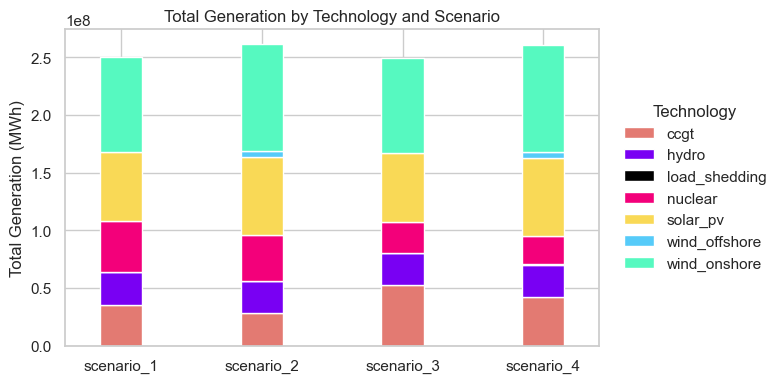

In [153]:
total_gen_all = total_gen_all.set_index('techs').fillna(0)
colors = [tech_colors[tech] for tech in total_gen_all.index]

fig, ax = plt.subplots(figsize=(8, 4))
total_gen_all.T.plot(
    kind="bar",
    stacked=True,
    ax=ax,
    width=0.3,
    color=colors
)

ax.set_ylabel("Total Generation (MWh)")
ax.set_title("Total Generation by Technology and Scenario")
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
ax.legend(
    title="Technology",
    bbox_to_anchor=(1.02, 0.5),
    loc="center left",
    frameon=False
)

plt.tight_layout()
plt.show()